# Preparação

In [1]:
import numpy as np
import pandas as pd
from zipfile import ZipFile
#import re
#import unidecode
import requests as req
from IPython.display import clear_output
#from unidecode import unidecode
import os

# Download dos dados da Receita Federal

In [2]:
#Função de download
def baixar(url, local):
    resposta = req.get(url, stream = True)
    
    if resposta.status_code == req.codes.OK:
        with open(local, 'wb') as novo_arquivo:
                for chunk in resposta.iter_content(chunk_size=1024):
                    if chunk:
                        novo_arquivo.write(chunk)
                    else:
                        novo_arquivo.write(resposta.content) 
                        
        print('Download concluído. Arquivo salvo em {}'.format(local))
    else:
        resposta.raise_for_status()

In [ ]:
# download propriamente dito
try:
    for i in range(0,10):
        clear_output(wait=True)
        caminho = f'http://200.152.38.155/CNPJ/Estabelecimentos{i}.zip'
        print(f'Fazendo download do arquivo {caminho} ...')
        destino = f'H:/OneDrive - Instituto Presbiteriano Mackenzie/02_PA/Estabelecimentos{i}.zip'        
        
        existencia = os.path.exists(destino)        
        
        if existencia == False:
            clear_output(wait=True)
            print(f'Fazendo Download do arquivo Estabelecimentos{i}!')
            baixar(caminho, destino)
        else:
            clear_output(wait=True)
            print(f'Arquivo Estabelecimentos{i} já baixado!')

        tamanho = os.path.getsize(destino)/1024/1024
        while tamanho < 320: #Verificação do tamanho do arquivo
            clear_output(wait=True)
            baixar(caminho, destino)            
            tamanho = os.path.getsize(destino)/1024/1024
            print(f'Verificando tamanho do arquivo...')

        clear_output(wait=True)     
        print(f'Download do arquivo Estabelecimentos{i} concluído!')
        
    clear_output(wait=True)           
    print('Todos os downloads de Estabelecimentos foram finalizados!')
    
except Exception as error:
    clear_output(wait=True)
    print(f'Erro ao baixar o arquivo do endereço {caminho}')

# Descompactação

In [3]:
#Função de descompactação
def descompact(origem, destinacao):
   with ZipFile(origem, 'r') as zipObj:
      # Extract all the contents of zip file in different directory
      zipObj.extractall(destinacao)
      print('Arquivo {} descompactado!'.format(origem))

In [ ]:
# descompactação propriamente dita

for i in range(0,10):
      
    de = f'H:/OneDrive - Instituto Presbiteriano Mackenzie/02_PA/Estabelecimentos{i}.zip'
    para = f'H:/OneDrive - Instituto Presbiteriano Mackenzie/02_PA/Estabelecimentos{i}'

    descompact(de, para)
    
    arquivoVelhoNome = os.listdir(para)
    os.rename(f'{para}/{arquivoVelhoNome[0]}', f'{para}/{arquivoVelhoNome[0]}.csv') #renomeando o arquivo descompactado
    clear_output(wait=True)

print('Trabalho Concluído!')

# Tratamento dos dados da Receita Federal

In [10]:
# Seleção dos estabelecimentos de Fortaleza/CE nos diversos arquivos

uniao_estabelecimentos = []

for i in range(0,10):
    
    file_path = f'H:/OneDrive - Instituto Presbiteriano Mackenzie/02_PA/Estabelecimentos{i}'
    
    file_csv = os.listdir(file_path)[0] 
    
    arquivo = pd.read_csv(f'file_path/{file_csv}',  sep=';', header=None, encoding = 'Latin-1', dtype='unicode', low_memory=False)

    clear_output(wait=True)

    arquivo = arquivo.drop([0,1,2,3,6,7,8,9,28,29], axis=1)    #Descartando atributos desnecessários, inclusive CNPJ
    arquivo = arquivo[(arquivo[19] == 'CE') & (arquivo[5] == "02") & (arquivo[20] == "2304400")]#2304400 é código IBGE de Fortaleza obtido do site do IBGE* #*https://www.ibge.gov.br/cidades-e-estados/ce/fortaleza.html
    uniao_estabelecimentos.append(arquivo)

uniao_estabelecimentos = pd.concat(uniao_estabelecimentos)

#Renomeando as colunas
uniao_estabelecimentos = uniao_estabelecimentos.rename(columns={13:'TIPO.LOGRADOURO', 14:'LOGRADOURO', 15:'NÚMERO', 16:'COMPLEMENTO', 17:'BAIRRO', 18:'CEP', 19:'UF', 20:'MUNICÍPIO'})

#Novo atributo
uniao_estabelecimentos['NOME.MUNICIPIO'] = 'FORTALEZA'

uniao_estabelecimentos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 292776 entries, 2 to 719308
Data columns (total 9 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   TIPO.LOGRADOURO  292776 non-null  object
 1   LOGRADOURO       292776 non-null  object
 2   NÚMERO           292776 non-null  object
 3   COMPLEMENTO      292776 non-null  object
 4   BAIRRO           292776 non-null  object
 5   CEP              292776 non-null  object
 6   UF               292776 non-null  object
 7   MUNICÍPIO        292776 non-null  int64 
 8   NOME.MUNICIPIO   292776 non-null  object
dtypes: int64(1), object(8)
memory usage: 22.3+ MB


In [9]:
uniao_estabelecimentos.head(3)

h:\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (9,12,13) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,TIPO.LOGRADOURO,LOGRADOURO,NÚMERO,COMPLEMENTO,BAIRRO,CEP,UF,MUNICÍPIO,NOME.MUNICIPIO
2,AVENIDA,GENERAL OSORIO DE PAIVA,973,SALA 08,PARANGABA,60720015,CE,1389,FORTALEZA
3,RUA,GUILHERME ROCHA,218,SALA 1104 E 1105,CENTRO,60030140,CE,1389,FORTALEZA
5,RUA,CONEGO DE CASTRO,5984,ND,PARQUE SANTA ROSA,60763003,CE,1389,FORTALEZA


In [7]:
uniao_estabelecimentos.head(3)

,TIPO.LOGRADOURO,LOGRADOURO,NÚMERO,COMPLEMENTO,BAIRRO,CEP,UF,MUNICÍPIO
2,AVENIDA,GENERAL OSORIO DE PAIVA,973,SALA 08,PARANGABA,60720015,CE,1389
3,RUA,GUILHERME ROCHA,218,SALA 1104 E 1105,CENTRO,60030140,CE,1389
5,RUA,CONEGO DE CASTRO,5984,ND,PARQUE SANTA ROSA,60763003,CE,1389


# Geocodificação

In [19]:
chave = 'xxxxx' # para uso na API

In [143]:
# Função de busca de coordenadas na API
def enderecoApi(tp_logra, logra, num_logra, bairro_logra, munic_logra, cep_logra, uf_logra):
    enderecamento = ''
    if (num_logra != 0 and num_logra != 'SN') and munic_logra != 'ND':
        enderecamento = f'{num_logra} {tp_logra} {logra} {bairro_logra} {munic_logra} {cep_logra} {uf_logra}'
    elif (num_logra == 0 or num_logra == 'SN') and munic_logra != 'ND':
        enderecamento = f'{tp_logra} {logra} {bairro_logra}, {munic_logra} {cep_logra} {uf_logra}'
    elif munic_logra == 'ND':
        enderecamento = f'{tp_logra} {logra} {bairro_logra} {cep_logra} {uf_logra}'
        
    return enderecamento

In [17]:
#Busca das coordenadas

for i in uniao_estabelecimentos.index:  
            
    endereco_busca = enderecoApi(uniao_estabelecimentos["TIPO.LOGRADOURO"][i], uniao_estabelecimentos["LOGRADOURO"][i], uniao_estabelecimentos["NÚMERO"][i], uniao_estabelecimentos["BAIRRO"][i], uniao_estabelecimentos["NOME.MUNICIPIO"][i], uniao_estabelecimentos["CEP"][i], uniao_estabelecimentos["UF"][i])
    
    res = req.get(f'https://geocode.search.hereapi.com/v1/geocode?q={endereco_busca}&lang=pt-BR&apiKey={chave}')
    
    cidade = 'ND'
    lat = None
    lon = None
    precisao_uf = 0
    precisao_cidade = 0
    precisao_cep = 0
    
    if len(res.json()['items']) > 0:
        if len(res.json()['items'][0]) > 0:
            precisao_uf = res.json()['items'][0]['scoring']['fieldScore'].get('state', 0)
            precisao_cidade = res.json()['items'][0]['scoring']['fieldScore'].get('city', 0)
            precisao_cep = res.json()['items'][0]['scoring']['fieldScore'].get('postalCode', 0)
            cidade = res.json()['items'][0]['address'].get('city', 'ND')
            lat = res.json()['items'][0]['position'].get('lat', False)
            lon = res.json()['items'][0]['position'].get('lng', False)                       
            
            if uniao_estabelecimentos['NOME.MUNICIPIO'][i] == 'ND' and (precisao_uf > 0.7 and precisao_cidade > 0.7):
                uniao_estabelecimentos['NOME.MUNICIPIO'][i] = cidade.upper()
                uniao_estabelecimentos['Latitude'][i] = lat
                uniao_estabelecimentos['Longitude'][i] = lon

            elif uniao_estabelecimentos['NOME.MUNICIPIO'][i] == 'ND' and (precisao_uf > 0.7 and precisao_cep > 0.7):
                uniao_estabelecimentos['NOME.MUNICIPIO'][i] = cidade.upper()
                uniao_estabelecimentos['Latitude'][i] = lat
                uniao_estabelecimentos['Longitude'][i] = lon
                
            else:
                uniao_estabelecimentos['Latitude'][i] = lat
                uniao_estabelecimentos['Longitude'][i] = lon
                
uniao_estabelecimentos.head(3)

,TIPO.LOGRADOURO,LOGRADOURO,NÚMERO,COMPLEMENTO,BAIRRO,CEP,UF,COD.IBGE.MUNICIPIO,NOME.MUNICIPIO,Longitude,Latitude,DIS.KM,AGENCIA_PROX
0,AVENIDA,GENERAL OSORIO DE PAIVA,973,SALA 08,PARANGABA,60720015,CE,2304400.0,FORTALEZA,-38.57057,-3.77825,0.632236,AGF JOAO XXIII
1,RUA,GUILHERME ROCHA,218,SALA 1104 E 1105,CENTRO,60030140,CE,2304400.0,FORTALEZA,-38.52822,-3.72687,0.217005,AGF PAJEU
2,RUA,CONEGO DE CASTRO,5984,ND,PARQUE SANTA ROSA,60763003,CE,2304400.0,FORTALEZA,-38.59908,-3.81483,4.456921,AGF MARAPONGA


In [18]:
uniao_estabelecimentos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292776 entries, 0 to 292775
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   CNPJ                292776 non-null  int64  
 1   TIPO.LOGRADOURO     292776 non-null  object 
 2   LOGRADOURO          292776 non-null  object 
 3   NÚMERO              292776 non-null  object 
 4   COMPLEMENTO         292776 non-null  object 
 5   BAIRRO              292776 non-null  object 
 6   CEP                 292776 non-null  int64  
 7   UF                  292776 non-null  object 
 8   COD.IBGE.MUNICIPIO  292776 non-null  float64
 9   NOME.MUNICIPIO      292776 non-null  object 
 10  Longitude           292776 non-null  float64
 11  Latitude            292776 non-null  float64
 12  DIS.KM              292776 non-null  float64
 13  AGENCIA_PROX        292776 non-null  object 
dtypes: float64(4), int64(2), object(8)
memory usage: 31.3+ MB


# Geocodificação da coordenadas das Agências dos Correios

In [ ]:
# Uso da planilha criada pelo Grupo com os endereço das agências dos Correios em Fortaleza/CE
agencias = pd.read_excel(r'H:\OneDrive - Instituto Presbiteriano Mackenzie\02_PA\Agencias_Correios_Fortaleza.xlsx')
agencias.head(3)

,Agência,Endereço,Complemento,Número,BAIRRO,Município,UF,CEP
0,AC ALDEOTA,RUA MARIA TOMASIA,NaN,683,ALDEOTA,FORTALEZA,CE,60150970
1,AC ALENCARINA,AVENIDA OLIVEIRA PAIVA,NaN,2800,CAMBEBA,FORTALEZA,CE,60822970
2,AC BARAO DE STUDART,AVENIDA BARAO DE STUDART,LOJA AB,1864,ALDEOTA,FORTALEZA,CE,60120970


In [19]:
#Busca das coordenadas das agências

for i in agencias.index:  
            
    endereco_busca = enderecoApi(agencias["Endereço"][i], agencias["Número"][i], agencias["BAIRRO"][i], agencias["Município"][i], agencias["CEP"][i], agencias["UF"][i])
    
    res = req.get(f'https://geocode.search.hereapi.com/v1/geocode?q={endereco_busca}&lang=pt-BR&apiKey={chave}')
    
    cidade = 'ND'
    lat = None
    lon = None
    precisao_uf = 0
    precisao_cidade = 0
    precisao_cep = 0
    
    if len(res.json()['items']) > 0:
        if len(res.json()['items'][0]) > 0:
            precisao_uf = res.json()['items'][0]['scoring']['fieldScore'].get('state', 0)
            precisao_cidade = res.json()['items'][0]['scoring']['fieldScore'].get('city', 0)
            precisao_cep = res.json()['items'][0]['scoring']['fieldScore'].get('postalCode', 0)
            cidade = res.json()['items'][0]['address'].get('city', 'ND')
            lat = res.json()['items'][0]['position'].get('lat', False)
            lon = res.json()['items'][0]['position'].get('lng', False)                       
            
            if agencias['Município'][i] == 'ND' and (precisao_uf > 0.7 and precisao_cidade > 0.7):
                agencias['Município'][i] = cidade.upper()
                agencias['LAT'][i] = lat
                agencias['LON'][i] = lon

            elif agencias['Município'][i] == 'ND' and (precisao_uf > 0.7 and precisao_cep > 0.7):
                agencias['Município'][i] = cidade.upper()
                agencias['LAT'][i] = lat
                agencias['LON'][i] = lon
                
            else:
                agencias['LAT'][i] = lat
                agencias['LON'][i] = lon
                
agencias.head(3)

,Agência,Endereço,Complemento,Número,BAIRRO,Município,UF,CEP,LAT,LON
0,AC ALDEOTA,RUA MARIA TOMASIA,NaN,683,ALDEOTA,FORTALEZA,CE,60150970,-3.73587,-38.49592
1,AC ALENCARINA,AVENIDA OLIVEIRA PAIVA,NaN,2800,CAMBEBA,FORTALEZA,CE,60822970,-3.79615,-38.48303
2,AC BARAO DE STUDART,AVENIDA BARAO DE STUDART,LOJA AB,1864,ALDEOTA,FORTALEZA,CE,60120970,-3.73975,-38.50838


# Calculando as Distâncias em km

In [2]:
from haversine import haversine
import re

In [21]:
agencias_sel = [] #lista de agências selecionada respectivamente para cada instituição
dist = [] #lista das distâncias mínimas selecionadas respectivamente para cada instituição

for j in uniao_estabelecimentos['CNPJ'].index:    
    
    if uniao_estabelecimentos['DIS.KM'][j] > 8: # retirar condição

        inst_coords = (float(uniao_estabelecimentos['Latitude'][j]), float(uniao_estabelecimentos['Longitude'][j]))

        distancia = 10**100

        agencia = None

        for i in agencias.index:

            agencia_coords = (float(agencias['LAT'][i]), float(agencias['LON'][i]))
            calculo = haversine(agencia_coords, inst_coords)  # distância haversine em km
            
            if   distancia >  calculo:
                distancia = calculo
                agencia = agencias['Agência'][i]
                
        uniao_estabelecimentos['DIS.KM'][j], uniao_estabelecimentos['AGENCIA_PROX'][j] = distancia, agencia

uniao_estabelecimentos.head(3)

h:\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (9,12,13) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,TIPO.LOGRADOURO,LOGRADOURO,NÚMERO,COMPLEMENTO,BAIRRO,CEP,UF,MUNICÍPIO,NOME.MUNICIPIO,Longitude,Latitude,DIS.KM,AGENCIA_PROX
2,AVENIDA,GENERAL OSORIO DE PAIVA,973,SALA 08,PARANGABA,60720015,CE,1389,FORTALEZA,-38.57057,-3.77825,0.6322358667606414,AGF JOAO XXIII
3,RUA,GUILHERME ROCHA,218,SALA 1104 E 1105,CENTRO,60030140,CE,1389,FORTALEZA,-38.52822,-3.72687,0.2170052672702245,AGF PAJEU
5,RUA,CONEGO DE CASTRO,5984,ND,PARQUE SANTA ROSA,60763003,CE,1389,FORTALEZA,-38.59908,-3.81483,3.5351648054116995,AC CAXIAS


In [ ]:
uniao_estabelecimentos = pd.read_csv(r'F:\correios\OneDrive - Correios.com.br\GEDEM\09_Power_BI\base_pbi.csv', sep=';')
uniao_estabelecimentos = uniao_estabelecimentos[uniao_estabelecimentos['NOME.MUNICIPIO'] == 'FORTALEZA']
uniao_estabelecimentos = uniao_estabelecimentos[['TIPO.LOGRADOURO', 'LOGRADOURO', 'NÚMERO', 'COMPLEMENTO','BAIRRO', 'CEP', 'UF', 'MUNICÍPIO', 'NOME.MUNICIPIO', 'Longitude', 'Latitude', 'DIS.KM', 'AGENCIA.PRONEG']]
uniao_estabelecimentos['DIS.KM'] = uniao_estabelecimentos['DIS.KM'].astype('float')
uniao_estabelecimentos.rename({'AGENCIA.PRONEG':'AGENCIA_PROX'}, axis=1, inplace=True)
uniao_estabelecimentos.head(3)

In [22]:
uniao_estabelecimentos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 292776 entries, 2 to 719308
Data columns (total 13 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   TIPO.LOGRADOURO  292776 non-null  object 
 1   LOGRADOURO       292776 non-null  object 
 2   NÚMERO           292776 non-null  object 
 3   COMPLEMENTO      292776 non-null  object 
 4   BAIRRO           292776 non-null  object 
 5   CEP              292776 non-null  object 
 6   UF               292776 non-null  object 
 7   MUNICÍPIO        292776 non-null  int64  
 8   NOME.MUNICIPIO   292776 non-null  object 
 9   Longitude        292776 non-null  float64
 10  Latitude         292776 non-null  float64
 11  DIS.KM           292776 non-null  object 
 12  AGENCIA_PROX     292776 non-null  object 
dtypes: float64(2), int64(1), object(10)
memory usage: 31.3+ MB


In [24]:
#Conferindo Quantoidade de Agências
lista_agencias = sorted(pd.unique(agencias['Agência']))
len(lista_agencias)

30

# Métricas Estatísticas

In [3]:
from scipy.stats import kurtosis
from scipy.stats import skew

In [51]:
uniao_estabelecimentos[['AGENCIA_PROX', 'DIS.KM']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 292776 entries, 2 to 719308
Data columns (total 2 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   AGENCIA_PROX  292776 non-null  object 
 1   DIS.KM        292776 non-null  float64
dtypes: float64(1), object(1)
memory usage: 14.8+ MB


In [29]:
uniao_estabelecimentos = pd.read_csv(r'H:\OneDrive - Instituto Presbiteriano Mackenzie\02_PA\PA_01_Inst_Agencias_Fortaleza_CE_com_erros.csv', sep=';')
uniao_estabelecimentos = uniao_estabelecimentos[['TIPO.LOGRADOURO', 'LOGRADOURO', 'NÚMERO', 'COMPLEMENTO',
       'BAIRRO', 'CEP', 'UF', 'COD.IBGE.MUNICIPIO', 'NOME.MUNICIPIO',
       'Longitude', 'Latitude', 'DIS.KM', 'AGENCIA_PROX']]
uniao_estabelecimentos.head(3)

,TIPO.LOGRADOURO,LOGRADOURO,NÚMERO,COMPLEMENTO,BAIRRO,CEP,UF,COD.IBGE.MUNICIPIO,NOME.MUNICIPIO,Longitude,Latitude,DIS.KM,AGENCIA_PROX
0,AVENIDA,GENERAL OSORIO DE PAIVA,973,SALA 08,PARANGABA,60720015,CE,2304400.0,FORTALEZA,-38.57057,-3.77825,0.632236,AGF JOAO XXIII
1,RUA,GUILHERME ROCHA,218,SALA 1104 E 1105,CENTRO,60030140,CE,2304400.0,FORTALEZA,-38.52822,-3.72687,0.217005,AGF PAJEU
2,RUA,CONEGO DE CASTRO,5984,ND,PARQUE SANTA ROSA,60763003,CE,2304400.0,FORTALEZA,-38.59908,-3.81483,4.456921,AGF MARAPONGA


In [30]:
agencias = pd.read_excel(r'H:\OneDrive - Instituto Presbiteriano Mackenzie\02_PA\Coordenadas_Agencias_Correios_Fortaleza.xlsx')
agencias.head(3)

,Agência,Endereço,Complemento,Número,BAIRRO,Município,UF,CEP,LAT,LON
0,AC ALDEOTA,RUA MARIA TOMASIA,NaN,683,ALDEOTA,FORTALEZA,CE,60150970,-3.73587,-38.49592
1,AC ALENCARINA,AVENIDA OLIVEIRA PAIVA,NaN,2800,CAMBEBA,FORTALEZA,CE,60822970,-3.79615,-38.48303
2,AC BARAO DE STUDART,AVENIDA BARAO DE STUDART,LOJA AB,1864,ALDEOTA,FORTALEZA,CE,60120970,-3.73975,-38.50838


In [33]:
uniao_estabelecimentos['DIS.KM'] = uniao_estabelecimentos['DIS.KM'].astype('float')

df_metricas = uniao_estabelecimentos[['AGENCIA_PROX', 'DIS.KM']].groupby('AGENCIA_PROX').agg(['mean','median', 'std','var', 'count', 'min', 'max']).values
df_metricas = pd.DataFrame(df_metricas)
df_metricas['UNIDADE'] = lista_agencias
df_metricas.rename({0:'Média', 1:'Mediana', 2:'Desvio-padrão', 3:'Variância', 4:'QTD INST', 5:'Mínimo', 6:'Máximo'}, axis=1, inplace=True)
df_metricas = df_metricas[['UNIDADE', 'QTD INST','Média', 'Mediana', 'Desvio-padrão', 'Variância', 'Mínimo','Máximo']]
df_metricas['Amplitude'] = df_metricas['Máximo'] - df_metricas['Mínimo']
df_metricas['Coeficiente de Variação'] = round(df_metricas['Desvio-padrão']/df_metricas['Média'], 2)

assimetrias = []
curtoses = []

for i in lista_agencias:
    lista_unidade = uniao_estabelecimentos[uniao_estabelecimentos['AGENCIA_PROX'] == i]['DIS.KM']
    curtose = kurtosis(lista_unidade)
    curtoses.append(curtose)
    assimetria = skew(lista_unidade)
    assimetrias.append(assimetria)
    
df_metricas['Assimetria/Skew'] = assimetrias
df_metricas['Curtose (Fisher)'] = curtoses

df_metricas.sort_values(by='QTD INST', ascending=False, ignore_index=True, inplace=True)

df_metricas = df_metricas.append({'UNIDADE' : 'GERAL' , 'QTD INST' : uniao_estabelecimentos['TIPO.LOGRADOURO'].count(), 'Média' : uniao_estabelecimentos['DIS.KM'].mean(), 'Mediana': uniao_estabelecimentos['DIS.KM'].median() , 'Desvio-padrão':uniao_estabelecimentos['DIS.KM'].std(), 'Variância': uniao_estabelecimentos['DIS.KM'].var(), 'Mínimo': uniao_estabelecimentos['DIS.KM'].min(), 'Máximo': uniao_estabelecimentos['DIS.KM'].max(), 'Amplitude': uniao_estabelecimentos['DIS.KM'].max() - uniao_estabelecimentos['DIS.KM'].min(), 'Coeficiente de Variação': round(uniao_estabelecimentos['DIS.KM'].std()/uniao_estabelecimentos['DIS.KM'].mean(), 2), 'Assimetria/Skew': skew(uniao_estabelecimentos['DIS.KM']), 'Curtose (Fisher)':kurtosis(uniao_estabelecimentos['DIS.KM'])} , ignore_index=True)

df_metricas

,UNIDADE,QTD INST,Média,Mediana,Desvio-padrão,Variância,Mínimo,Máximo,Amplitude,Coeficiente de Variação,Assimetria/Skew,Curtose (Fisher)
0,AGF MARAPONGA,21875.0,2.406031,2.319844,1.245963,1.552425,0.0,6.256113,6.256113,0.52,0.314446,-0.423119
1,AC ALDEOTA,20076.0,0.744884,0.664822,0.437261,0.191197,0.0,2.425828,2.425828,0.59,0.908659,0.766125
2,AC CONJUNTO CEARA,19883.0,2.569663,2.397255,2.029186,4.117598,0.0,193.623687,193.623687,0.79,42.205074,3950.498883
3,AC ALENCARINA,17585.0,1.858371,1.706381,1.122547,1.260113,0.0,8.202103,8.202103,0.60,1.497960,4.403033
4,AC MONDUBIM,17205.0,4.595717,2.084240,81.765090,6685.529888,0.0,3252.052394,3252.052394,17.79,35.070367,1256.067780
5,AGF MOZART LUCENA,16459.0,1.522102,1.499660,0.726520,0.527831,0.0,7.901592,7.901592,0.48,1.020452,6.388030
6,AGF DUNAS,14527.0,3.589087,1.301043,111.131668,12350.247692,0.0,5992.294749,5992.294749,30.96,53.867179,2899.915538
7,AGF SARGENTO HERMINIO,12223.0,1.398962,1.405948,0.638359,0.407503,0.0,2.993612,2.993612,0.46,0.033766,-0.872123
8,AGF CAJAZEIRAS,11294.0,2.036032,1.941358,0.982491,0.965288,0.0,4.019909,4.019909,0.48,-0.045506,-1.103088
9,AGF HENRIQUE JORGE,10909.0,1.238113,1.203903,0.571043,0.326090,0.0,2.700640,2.700640,0.46,0.251982,-0.568131


In [34]:
df_metricas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31 entries, 0 to 30
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UNIDADE                  31 non-null     object 
 1   QTD INST                 31 non-null     float64
 2   Média                    31 non-null     float64
 3   Mediana                  31 non-null     float64
 4   Desvio-padrão            31 non-null     float64
 5   Variância                31 non-null     float64
 6   Mínimo                   31 non-null     float64
 7   Máximo                   31 non-null     float64
 8   Amplitude                31 non-null     float64
 9   Coeficiente de Variação  31 non-null     float64
 10  Assimetria/Skew          31 non-null     float64
 11  Curtose (Fisher)         31 non-null     float64
dtypes: float64(11), object(1)
memory usage: 3.0+ KB


# Retirada de *Outliers*

In [62]:
quartil_01 = np.percentile(uniao_estabelecimentos['DIS.KM'], 25)
quartil_03 = np.percentile(uniao_estabelecimentos['DIS.KM'], 75)
uniao_estabelecimentos = uniao_estabelecimentos[uniao_estabelecimentos['DIS.KM'] <= 37] # 37km é o desvio-padrão do conjunto de distâncias, que podem ser causados por falha na geocodificação usando a API, esta por sua vez retornando posicionamento por má identificação dos endereços inserido
int_quartil = (quartil_03 - quartil_01)
min_ = quartil_01 - 1.5*int_quartil
max_ = quartil_03 + 1.5*int_quartil
print(min_, max_ )

-1.4473489057206688 4.024034757582234


In [65]:
uniao_estabelecimentos = uniao_estabelecimentos[ (uniao_estabelecimentos['DIS.KM'] >= min_) | (uniao_estabelecimentos['DIS.KM'] <= max_)]

uniao_estabelecimentos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 292730 entries, 0 to 292775
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   TIPO.LOGRADOURO     292730 non-null  object 
 1   LOGRADOURO          292730 non-null  object 
 2   NÚMERO              292730 non-null  object 
 3   COMPLEMENTO         292730 non-null  object 
 4   BAIRRO              292730 non-null  object 
 5   CEP                 292730 non-null  int64  
 6   UF                  292730 non-null  object 
 7   COD.IBGE.MUNICIPIO  292730 non-null  float64
 8   NOME.MUNICIPIO      292730 non-null  object 
 9   Longitude           292730 non-null  float64
 10  Latitude            292730 non-null  float64
 11  DIS.KM              292730 non-null  float64
 12  AGENCIA_PROX        292730 non-null  object 
dtypes: float64(4), int64(1), object(8)
memory usage: 31.3+ MB


# Novas Métricas Estatísticas

In [66]:
uniao_estabelecimentos['DIS.KM'] = uniao_estabelecimentos['DIS.KM'].astype('float')

df_metricas = uniao_estabelecimentos[['AGENCIA_PROX', 'DIS.KM']].groupby('AGENCIA_PROX').agg(['mean','median', 'std','var', 'count', 'min', 'max']).values
df_metricas = pd.DataFrame(df_metricas)
df_metricas['UNIDADE'] = lista_agencias
df_metricas.rename({0:'Média', 1:'Mediana', 2:'Desvio-padrão', 3:'Variância', 4:'QTD INST', 5:'Mínimo', 6:'Máximo'}, axis=1, inplace=True)
df_metricas = df_metricas[['UNIDADE', 'QTD INST','Média', 'Mediana', 'Desvio-padrão', 'Variância', 'Mínimo','Máximo']]
df_metricas['Amplitude'] = df_metricas['Máximo'] - df_metricas['Mínimo']
df_metricas['Coeficiente de Variação'] = round(df_metricas['Desvio-padrão']/df_metricas['Média'], 2)

assimetrias = []
curtoses = []

for i in lista_agencias:
    lista_unidade = uniao_estabelecimentos[uniao_estabelecimentos['AGENCIA_PROX'] == i]['DIS.KM']
    curtose = kurtosis(lista_unidade)
    curtoses.append(curtose)
    assimetria = skew(lista_unidade)
    assimetrias.append(assimetria)
    
df_metricas['Assimetria/Skew'] = assimetrias
df_metricas['Curtose (Fisher)'] = curtoses

df_metricas.sort_values(by='QTD INST', ascending=False, ignore_index=True, inplace=True)

df_metricas = df_metricas.append({'UNIDADE' : 'GERAL' , 'QTD INST' : uniao_estabelecimentos['TIPO.LOGRADOURO'].count(), 'Média' : uniao_estabelecimentos['DIS.KM'].mean(), 'Mediana': uniao_estabelecimentos['DIS.KM'].median() , 'Desvio-padrão':uniao_estabelecimentos['DIS.KM'].std(), 'Variância': uniao_estabelecimentos['DIS.KM'].var(), 'Mínimo': uniao_estabelecimentos['DIS.KM'].min(), 'Máximo': uniao_estabelecimentos['DIS.KM'].max(), 'Amplitude': uniao_estabelecimentos['DIS.KM'].max() - uniao_estabelecimentos['DIS.KM'].min(), 'Coeficiente de Variação': round(uniao_estabelecimentos['DIS.KM'].std()/uniao_estabelecimentos['DIS.KM'].mean(), 2), 'Assimetria/Skew': skew(uniao_estabelecimentos['DIS.KM']), 'Curtose (Fisher)':kurtosis(uniao_estabelecimentos['DIS.KM'])} , ignore_index=True)

df_metricas

,UNIDADE,QTD INST,Média,Mediana,Desvio-padrão,Variância,Mínimo,Máximo,Amplitude,Coeficiente de Variação,Assimetria/Skew,Curtose (Fisher)
0,AGF MARAPONGA,21875.0,2.406031,2.319844,1.245963,1.552425,0.0,6.256113,6.256113,0.52,0.314446,-0.423119
1,AC ALDEOTA,20076.0,0.744884,0.664822,0.437261,0.191197,0.0,2.425828,2.425828,0.59,0.908659,0.766125
2,AC CONJUNTO CEARA,19882.0,2.560054,2.397242,1.510532,2.281706,0.0,7.886201,7.886201,0.59,0.562143,-0.527760
3,AC ALENCARINA,17585.0,1.858371,1.706381,1.122547,1.260113,0.0,8.202103,8.202103,0.60,1.497960,4.403033
4,AC MONDUBIM,17189.0,2.206912,2.080534,1.225944,1.502940,0.0,16.084915,16.084915,0.56,0.619574,1.216606
5,AGF MOZART LUCENA,16459.0,1.522102,1.499660,0.726520,0.527831,0.0,7.901592,7.901592,0.48,1.020452,6.388030
6,AGF DUNAS,14522.0,1.527144,1.301043,1.015635,1.031514,0.0,5.975812,5.975812,0.67,1.035767,0.930733
7,AGF SARGENTO HERMINIO,12223.0,1.398962,1.405948,0.638359,0.407503,0.0,2.993612,2.993612,0.46,0.033766,-0.872123
8,AGF CAJAZEIRAS,11294.0,2.036032,1.941358,0.982491,0.965288,0.0,4.019909,4.019909,0.48,-0.045506,-1.103088
9,AGF HENRIQUE JORGE,10909.0,1.238113,1.203903,0.571043,0.326090,0.0,2.700640,2.700640,0.46,0.251982,-0.568131


# Gráficos com *Seaborn*

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
import statistics
%matplotlib inline

<Figure size 1440x864 with 0 Axes>

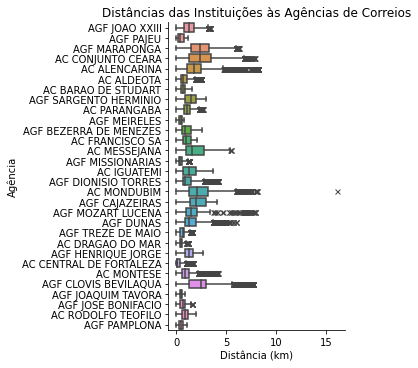

In [67]:
#Boxplot Horizontal
plt.figure(figsize =(20, 12))
sns.catplot(y = 'AGENCIA_PROX', x = 'DIS.KM', data = uniao_estabelecimentos, orient='h', kind="box", margin_titles=True, flierprops={"marker": "x"})
plt.title("Distâncias das Instituições às Agências de Correios", loc="center", fontsize=12)
plt.xlabel("Distância (km)")
plt.ylabel("Agência")
plt.show()

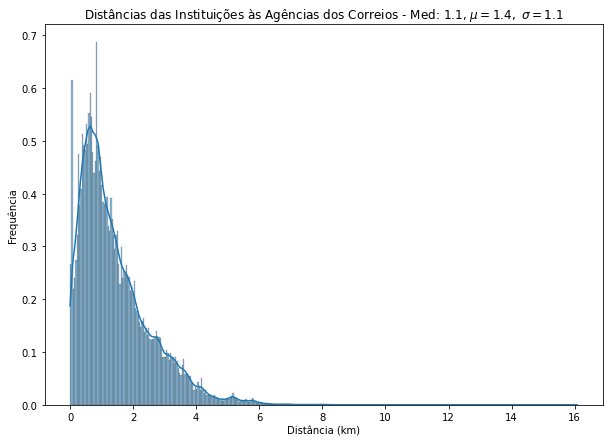

In [68]:
#Histograma com densidade
plt.figure(figsize =(10,7))
n_vetor = uniao_estabelecimentos['DIS.KM']
sns.histplot(data=uniao_estabelecimentos, x="DIS.KM", kde=True,stat="density")
plt.title(f"Distâncias das Instituições às Agências dos Correios - Med: {round(statistics.median(n_vetor), 1)}, " + fr'$\mu={round(statistics.mean(n_vetor),1)},\ \sigma={round(statistics.stdev(n_vetor),1)}$', loc="center", fontsize=12)
plt.xlabel("Distância (km)")
plt.ylabel("Frequência")
plt.show()

<Figure size 720x432 with 0 Axes>

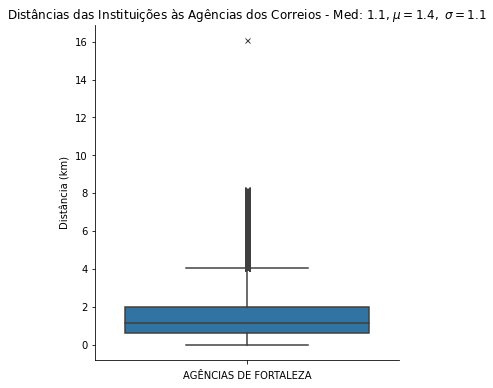

In [69]:
#Boxplot com os dados gerais
plt.figure(figsize =(10,6))
n_vetor = uniao_estabelecimentos['DIS.KM']
sns.catplot(y= 'DIS.KM', data = uniao_estabelecimentos, kind="box", margin_titles=True, flierprops={"marker": "x"})
plt.title(f"Distâncias das Instituições às Agências dos Correios - Med: {round(statistics.median(n_vetor), 1)}, " + fr'$\mu={round(statistics.mean(n_vetor),1)},\ \sigma={round(statistics.stdev(n_vetor),1)}$', loc="center", fontsize=12)
plt.xlabel("AGÊNCIAS DE FORTALEZA")
plt.ylabel("Distância (km)")
plt.show()

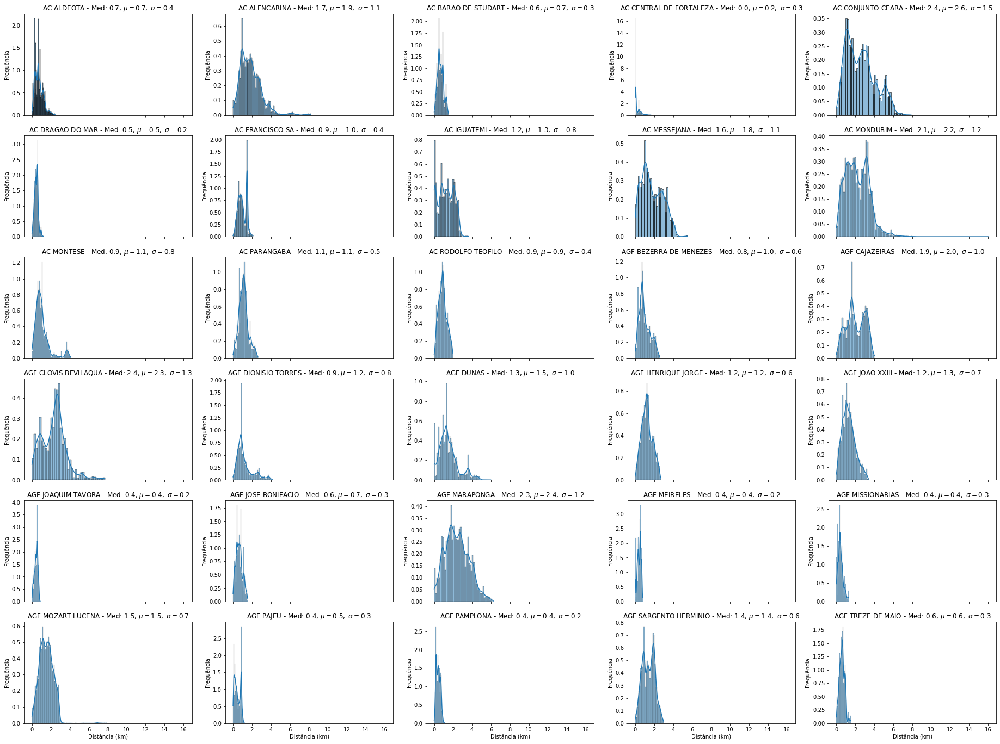

In [70]:
#Histograma e gráfico de densidade considerando a distribuição das instituições por cada agência dos Correios de Fortaleza
figure, axis = plt.subplots(6,5, figsize=(32,24), sharex=True ) # sharey=True, figsize=(20,8)

x = 0
y = 0

for i in lista_agencias:
    
    df_ag = uniao_estabelecimentos[uniao_estabelecimentos['AGENCIA_PROX'] == i]#['DIS.KM']
    vetor = df_ag['DIS.KM']
    sns.histplot(data=df_ag, x="DIS.KM", kde=True,stat="density", ax=axis[x][y])    
    axis[x, y].set_title(f"{i} - Med: {round(statistics.median(vetor), 1)}, " + fr'$\mu={round(statistics.mean(vetor),1)},\ \sigma={round(statistics.stdev(vetor),1)}$') 
    axis[x, y].set_ylabel('Frequência')
    axis[x, y].set_xlabel('Distância (km)')
    
    y += 1
    
    if y > 4:
        y -= 5
        x += 1
        
plt.show()

In [71]:
#Contagem de Instituições por agência
uniao_estabelecimentos['AGENCIA_PROX'].value_counts()

AGF MARAPONGA              21875
AC ALDEOTA                 20076
AC CONJUNTO CEARA          19882
AC ALENCARINA              17585
AC MONDUBIM                17189
AGF MOZART LUCENA          16459
AGF DUNAS                  14522
AGF SARGENTO HERMINIO      12223
AGF CAJAZEIRAS             11294
AGF HENRIQUE JORGE         10909
AC MESSEJANA               10849
AC CENTRAL DE FORTALEZA    10846
AGF DIONISIO TORRES        10655
AC MONTESE                 10043
AGF JOAO XXIII              9511
AC FRANCISCO SA             8110
AGF BEZERRA DE MENEZES      7632
AC IGUATEMI                 7149
AC PARANGABA                6913
AGF PAJEU                   6778
AGF MISSIONARIAS            5902
AC RODOLFO TEOFILO          5362
AC BARAO DE STUDART         5335
AGF CLOVIS BEVILAQUA        5137
AC DRAGAO DO MAR            4097
AGF JOSE BONIFACIO          3863
AGF MEIRELES                3813
AGF TREZE DE MAIO           3251
AGF JOAQUIM TAVORA          3012
AGF PAMPLONA                2458
Name: AGEN

In [72]:
#Geração de arquivo csv
df_metricas.to_csv(r'H:\OneDrive - Instituto Presbiteriano Mackenzie\02_PA\Estatisticas_AC.csv', sep=';', index=False)

In [73]:
#Geração de arquivo excel de estatísticas
df_metricas.to_excel(r'H:\OneDrive - Instituto Presbiteriano Mackenzie\02_PA\Estatisticas_AC.xlsx', index=False)

In [75]:
#Geração de arquivo excel de coordenadas e distribuição das instituições por agência de correios
uniao_estabelecimentos.to_excel(r'H:\OneDrive - Instituto Presbiteriano Mackenzie\02_PA\PA_01_Inst_Agencias_Fortaleza_CE_Final.xlsx', index=False)

# Mapas com *Scatterplot*

In [76]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

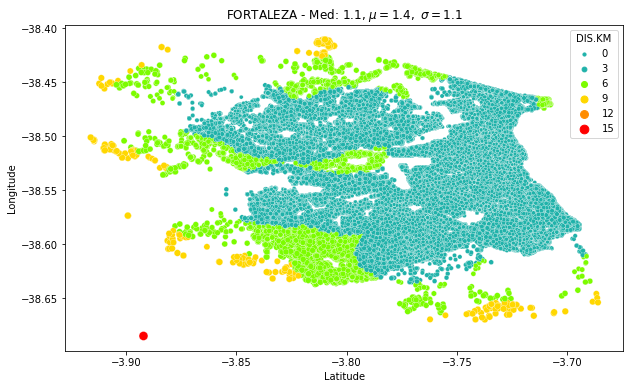

In [77]:
#Visão geral das distâncias em Fortaleza
plt.figure(figsize =(10,6))
n_vetor = uniao_estabelecimentos['DIS.KM']
cmap = ListedColormap(["lightseagreen","lawngreen", "gold","darkorange", "red"])
sns.scatterplot(data=uniao_estabelecimentos, x="Latitude", y="Longitude", hue='DIS.KM',  size='DIS.KM', sizes=(10,80), palette= cmap)
plt.title(f"FORTALEZA - Med: {round(statistics.median(n_vetor), 1)}, " + fr'$\mu={round(statistics.mean(n_vetor),1)},\ \sigma={round(statistics.stdev(n_vetor),1)}$', loc="center", fontsize=12)
plt.xlabel("Latitude")
plt.ylabel("Longitude")
plt.show()

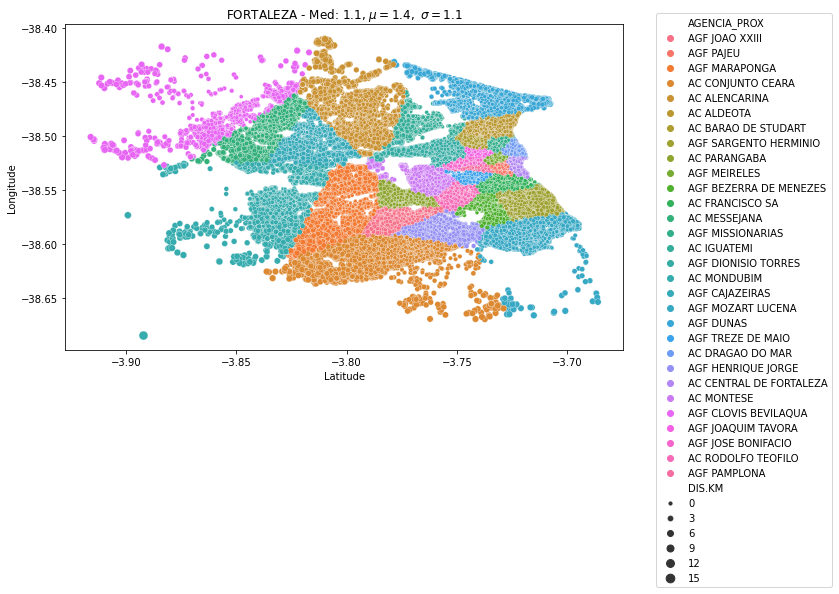

In [78]:
#Visão geral da distribuição de instituições por Agência de Correios Fortaleza
plt.figure(figsize =(10,6))
n_vetor = uniao_estabelecimentos['DIS.KM']
g = sns.scatterplot(data=uniao_estabelecimentos, x="Latitude", y="Longitude", hue='AGENCIA_PROX',  size='DIS.KM', sizes=(10,80))
plt.title(f"FORTALEZA - Med: {round(statistics.median(n_vetor), 1)}, " + fr'$\mu={round(statistics.mean(n_vetor),1)},\ \sigma={round(statistics.stdev(n_vetor),1)}$', loc="center", fontsize=12)
plt.xlabel("Latitude")
plt.ylabel("Longitude")
sns.move_legend(g, "upper left", bbox_to_anchor=(1.05, 1.05))
plt.show()

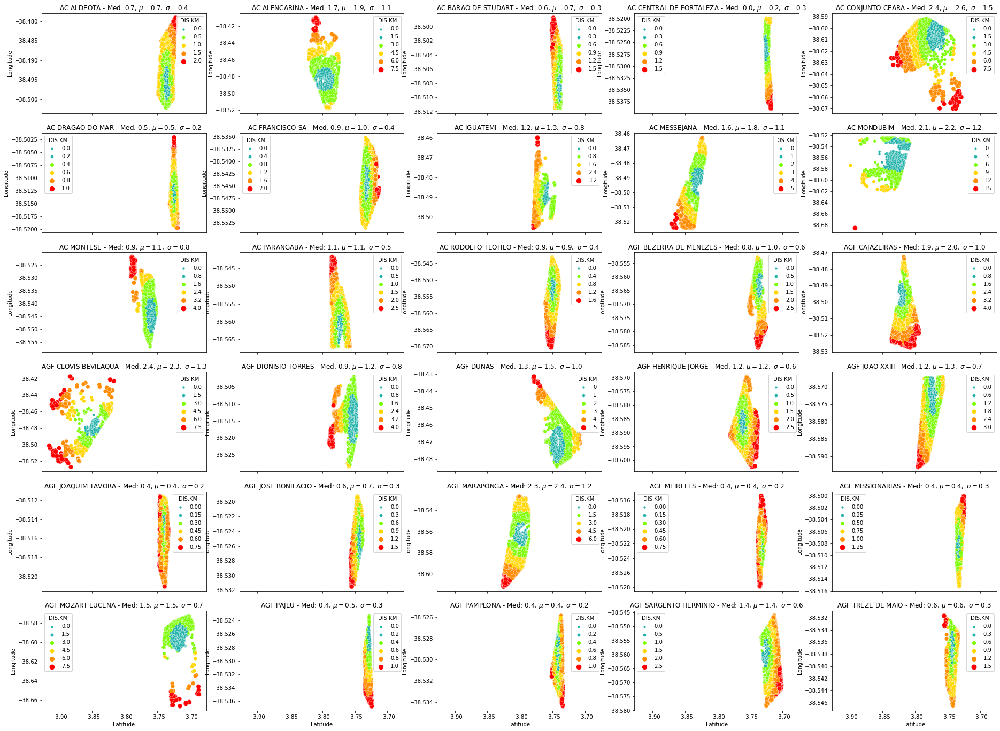

In [79]:
#Visão geral da distribuição de instituições por Cada Agência de Correios Fortaleza
figure, axis = plt.subplots(6,5, figsize=(32,24), sharex=True) # sharey=True, figsize=(20,8)

x = 0
y = 0

for i in lista_agencias:
    
    df_ag = uniao_estabelecimentos[uniao_estabelecimentos['AGENCIA_PROX'] == i]#['DIS.KM']
    vetor = df_ag['DIS.KM']
    sns.scatterplot(data=df_ag, x="Latitude", y="Longitude", hue='DIS.KM',  size='DIS.KM', sizes=(10,80), ax=axis[x][y], palette= cmap)
    axis[x, y].set_title(f"{i} - Med: {round(statistics.median(vetor), 1)}, " + fr'$\mu={round(statistics.mean(vetor),1)},\ \sigma={round(statistics.stdev(vetor),1)}$')     
    axis[x, y].set_ylabel('Longitude')
    axis[x, y].set_xlabel('Latitude')    
    
    y += 1
    
    if y > 4:
        y -= 5
        x += 1
        
plt.show()

# Mapas com *Folium*

In [80]:
import folium
from folium import plugins

In [81]:
agencias.head(2)

,Agência,Endereço,Complemento,Número,BAIRRO,Município,UF,CEP,LAT,LON
0,AC ALDEOTA,RUA MARIA TOMASIA,NaN,683,ALDEOTA,FORTALEZA,CE,60150970,-3.73587,-38.49592
1,AC ALENCARINA,AVENIDA OLIVEIRA PAIVA,NaN,2800,CAMBEBA,FORTALEZA,CE,60822970,-3.79615,-38.48303


In [82]:
coord_x = []

#definindo lista de coordenadas das instituições a serem anexadas ao mapa
for lat, lon in zip(uniao_estabelecimentos.Latitude.values, uniao_estabelecimentos.Longitude.values):
    coord_x.append([lat, lon])

#Definição da localização do mapa
mp_x = folium.Map(location=[-3.79615,-38.48303], zoom_start=11)

#anexando coordenadas das agências dos correios ao mapa
for j in agencias.index:    
    agen_selec = agencias['Agência'][j]
    agen_bairro = agencias['BAIRRO'][j]
     # tiles=['Stamen Terrain', 'Stamen Toner']
    folium.Marker([agencias.LAT[j], agencias.LON[j]],
                popup=f'<i>{agen_selec}</i>',
                icon=folium.Icon(color="blue"),
                tooltip = f'Bairro {agen_bairro}'
                ).add_to(mp_x)

#anexando lista de coordenadas das instituições a serem anexadas ao mapa como heatmap
mp_x.add_child(plugins.HeatMap(coord_x))

#mostrando o mapa
mp_x

In [83]:
#salvando o mapa como html
mp_x.save(r'H:\OneDrive - Instituto Presbiteriano Mackenzie\02_PA\index.html')

# K-Médias

In [84]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [85]:
Kmean = KMeans(n_clusters=30)
Kmean.fit_predict(uniao_estabelecimentos[['Latitude', 'Longitude']])

array([ 9,  7, 10, ...,  2, 19, 12])

In [86]:
Kmean.inertia_

31.628720975493955

In [89]:
len(Kmean.labels_)

292730

In [93]:
Kmean.cluster_centers_[:,0], Kmean.cluster_centers_[:,1]

(array([-3.85574783, -3.74216407, -3.73580376, -3.80391643, -3.70655261,
        -3.81232907, -3.80043053, -3.72741032, -3.78100741, -3.76759692,
        -3.81716059, -3.7440473 , -3.83267033, -3.82601465, -3.78107759,
        -3.72511681, -3.83871681, -3.74437996, -3.76132821, -3.79587829,
        -3.74925739, -3.72448813, -3.7671801 , -3.78973223, -3.75256048,
        -3.79568761, -3.77245874, -3.71712121, -3.8037033 , -3.72448408]),
 array([-38.49079188, -38.56208632, -38.49797853, -38.56701427,
        -38.58096372, -38.51203265, -38.61803445, -38.52420414,
        -38.50977638, -38.57623932, -38.59217391, -38.47334274,
        -38.5636423 , -38.48172881, -38.55578012, -38.5444143 ,
        -38.51856988, -38.53162208, -38.54439539, -38.45733338,
        -38.5120414 , -38.47348518, -38.48565243, -38.58971203,
        -38.59249125, -38.48686161, -38.60762824, -38.5630435 ,
        -38.53978971, -38.59311079]))

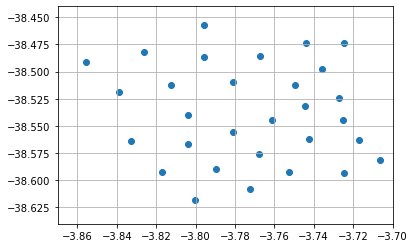

In [104]:
plt.scatter(Kmean.cluster_centers_[:,0], Kmean.cluster_centers_[:,1])
plt.xlim(-3.87, -3.7)
plt.ylim(-38.64, -38.44)
plt.grid()

In [105]:
uniao_estabelecimentos['POSIC_AGEN_SUG'] = Kmean.labels_

uniao_estabelecimentos.head()

,TIPO.LOGRADOURO,LOGRADOURO,NÚMERO,COMPLEMENTO,BAIRRO,CEP,UF,COD.IBGE.MUNICIPIO,NOME.MUNICIPIO,Longitude,Latitude,DIS.KM,AGENCIA_PROX,POSIC_AGEN_SUG
0,AVENIDA,GENERAL OSORIO DE PAIVA,973,SALA 08,PARANGABA,60720015,CE,2304400.0,FORTALEZA,-38.57057,-3.77825,0.632236,AGF JOAO XXIII,9
1,RUA,GUILHERME ROCHA,218,SALA 1104 E 1105,CENTRO,60030140,CE,2304400.0,FORTALEZA,-38.52822,-3.72687,0.217005,AGF PAJEU,7
2,RUA,CONEGO DE CASTRO,5984,ND,PARQUE SANTA ROSA,60763003,CE,2304400.0,FORTALEZA,-38.59908,-3.81483,4.456921,AGF MARAPONGA,10
3,RUA,NEREIDE,540,ND,GRANJA PORTUGAL,60540685,CE,2304400.0,FORTALEZA,-38.59596,-3.78841,2.590478,AC CONJUNTO CEARA,23
4,RUA,TANCREDO DE SOUZA CARVALHO,377,ND,EDSON QUEIROZ,60834065,CE,2304400.0,FORTALEZA,-38.45619,-3.78544,3.207243,AC ALENCARINA,19


# Novas Distâncias

In [ ]:
def dist_nv(la1, lo1, la2, lo2):
    return haversine((la1, lo1), (la2, lo2)) 

In [107]:
lats, lons = Kmean.cluster_centers_[:,0], Kmean.cluster_centers_[:,1]

agencias_sel = [] #lista de agências selecionada respectivamente para cada instituição
dist = [] #lista das distâncias mínimas selecionadas respectivamente para cada instituição

for j in uniao_estabelecimentos.index:    
    
    inst_coords = (float(uniao_estabelecimentos['Latitude'][j]), float(uniao_estabelecimentos['Longitude'][j]))

    agencia_coords = (float(lats[uniao_estabelecimentos['POSIC_AGEN_SUG'][j]]), float(lons[uniao_estabelecimentos['POSIC_AGEN_SUG'][j]]))
    
    calculo = haversine(agencia_coords, inst_coords)  # distância haversine em km
    
    dist.append(calculo)
            
uniao_estabelecimentos['DIS.KM_NV'] = dist

uniao_estabelecimentos.head(3)

,TIPO.LOGRADOURO,LOGRADOURO,NÚMERO,COMPLEMENTO,BAIRRO,CEP,UF,COD.IBGE.MUNICIPIO,NOME.MUNICIPIO,Longitude,Latitude,DIS.KM,AGENCIA_PROX,POSIC_AGEN_SUG,DIS.KM_NV
0,AVENIDA,GENERAL OSORIO DE PAIVA,973,SALA 08,PARANGABA,60720015,CE,2304400.0,FORTALEZA,-38.57057,-3.77825,0.632236,AGF JOAO XXIII,9,1.341227
1,RUA,GUILHERME ROCHA,218,SALA 1104 E 1105,CENTRO,60030140,CE,2304400.0,FORTALEZA,-38.52822,-3.72687,0.217005,AGF PAJEU,7,0.449632
2,RUA,CONEGO DE CASTRO,5984,ND,PARQUE SANTA ROSA,60763003,CE,2304400.0,FORTALEZA,-38.59908,-3.81483,4.456921,AGF MARAPONGA,10,0.808860


# Novas Métricas Estatísticas após Clusterização

In [121]:
uniao_estabelecimentos['DIS.KM_NV'] = uniao_estabelecimentos['DIS.KM_NV'].astype('float')

novas_agencias = pd.unique(uniao_estabelecimentos['POSIC_AGEN_SUG'])

df_metricas = uniao_estabelecimentos[['POSIC_AGEN_SUG', 'DIS.KM_NV']].groupby('POSIC_AGEN_SUG').agg(['mean','median', 'std','var', 'count', 'min', 'max']).values
df_metricas = pd.DataFrame(df_metricas)
df_metricas['UNIDADE'] = novas_agencias
df_metricas.rename({0:'Média', 1:'Mediana', 2:'Desvio-padrão', 3:'Variância', 4:'QTD INST', 5:'Mínimo', 6:'Máximo'}, axis=1, inplace=True)
df_metricas = df_metricas[['UNIDADE', 'QTD INST','Média', 'Mediana', 'Desvio-padrão', 'Variância', 'Mínimo','Máximo']]
df_metricas['Amplitude'] = df_metricas['Máximo'] - df_metricas['Mínimo']
df_metricas['Coeficiente de Variação'] = round(df_metricas['Desvio-padrão']/df_metricas['Média'], 2)

assimetrias = []
curtoses = []

for i in novas_agencias:
    lista_unidade = uniao_estabelecimentos[uniao_estabelecimentos['POSIC_AGEN_SUG'] == i]['DIS.KM_NV']
    curtose = kurtosis(lista_unidade)
    curtoses.append(curtose)
    assimetria = skew(lista_unidade)
    assimetrias.append(assimetria)
    
df_metricas['Assimetria/Skew'] = assimetrias
df_metricas['Curtose (Fisher)'] = curtoses

df_metricas.sort_values(by='QTD INST', ascending=False, ignore_index=True, inplace=True)

df_metricas = df_metricas.append({'UNIDADE' : 'GERAL' , 'QTD INST' : uniao_estabelecimentos['TIPO.LOGRADOURO'].count(), 'Média' : uniao_estabelecimentos['DIS.KM_NV'].mean(), 'Mediana': uniao_estabelecimentos['DIS.KM_NV'].median() , 'Desvio-padrão':uniao_estabelecimentos['DIS.KM_NV'].std(), 'Variância': uniao_estabelecimentos['DIS.KM_NV'].var(), 'Mínimo': uniao_estabelecimentos['DIS.KM_NV'].min(), 'Máximo': uniao_estabelecimentos['DIS.KM_NV'].max(), 'Amplitude': uniao_estabelecimentos['DIS.KM_NV'].max() - uniao_estabelecimentos['DIS.KM_NV'].min(), 'Coeficiente de Variação': round(uniao_estabelecimentos['DIS.KM_NV'].std()/uniao_estabelecimentos['DIS.KM_NV'].mean(), 2), 'Assimetria/Skew': skew(uniao_estabelecimentos['DIS.KM_NV']), 'Curtose (Fisher)':kurtosis(uniao_estabelecimentos['DIS.KM_NV'])} , ignore_index=True)

df_metricas

,UNIDADE,QTD INST,Média,Mediana,Desvio-padrão,Variância,Mínimo,Máximo,Amplitude,Coeficiente de Variação,Assimetria/Skew,Curtose (Fisher)
0,10,26351.0,0.815425,0.820443,0.414060,0.171445,0.014594,1.888269,1.873675,0.51,0.961532,4.598124
1,27,26172.0,0.723694,0.621689,0.379307,0.143874,0.001943,1.821838,1.819895,0.52,-0.112172,-0.498693
2,26,13666.0,0.895729,0.868591,0.349155,0.121909,0.019069,1.907056,1.887987,0.39,4.666109,33.985143
3,24,11532.0,1.119332,1.116694,0.591197,0.349513,0.015229,8.204519,8.189290,0.53,-0.014256,1.590967
4,29,11246.0,0.930112,0.911561,0.421499,0.177661,0.019077,2.246087,2.227010,0.45,4.169090,41.760038
5,7,10711.0,1.024036,0.995461,0.419458,0.175945,0.027355,2.065667,2.038312,0.41,0.588873,-0.659931
6,1,10489.0,1.044261,1.079798,0.392536,0.154085,0.004376,1.895268,1.890892,0.38,0.011001,-0.618704
7,28,10221.0,1.250617,1.219240,0.601717,0.362063,0.023714,6.665128,6.641414,0.48,0.125360,-0.332611
8,18,9966.0,0.944978,0.981082,0.377940,0.142839,0.007289,1.999097,1.991808,0.40,0.205363,-0.392608
9,12,9828.0,0.877031,0.795170,0.294858,0.086941,0.004570,1.698058,1.693488,0.34,3.041776,22.007185


# Novos Gráficos

<Figure size 1440x864 with 0 Axes>

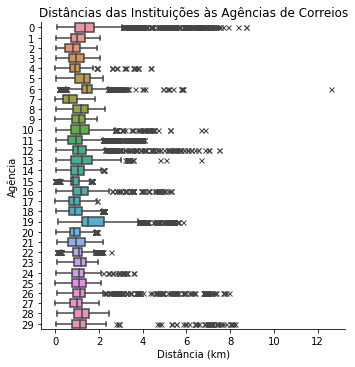

In [122]:
#Boxplot Horizontal
plt.figure(figsize =(20, 12))
sns.catplot(y = 'POSIC_AGEN_SUG', x = 'DIS.KM_NV', data = uniao_estabelecimentos, orient='h', kind="box", margin_titles=True, flierprops={"marker": "x"})
plt.title("Distâncias das Instituições às Agências de Correios", loc="center", fontsize=12)
plt.xlabel("Distância (km)")
plt.ylabel("Agência")
plt.show()

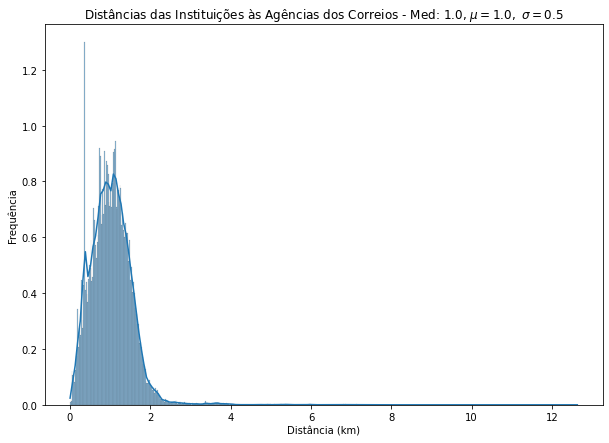

In [123]:
#Histograma com densidade
plt.figure(figsize =(10,7))
n_vetor = uniao_estabelecimentos['DIS.KM_NV']
sns.histplot(data=uniao_estabelecimentos, x="DIS.KM_NV", kde=True,stat="density")
plt.title(f"Distâncias das Instituições às Agências dos Correios - Med: {round(statistics.median(n_vetor), 1)}, " + fr'$\mu={round(statistics.mean(n_vetor),1)},\ \sigma={round(statistics.stdev(n_vetor),1)}$', loc="center", fontsize=12)
plt.xlabel("Distância (km)")
plt.ylabel("Frequência")
plt.show()

<Figure size 720x432 with 0 Axes>

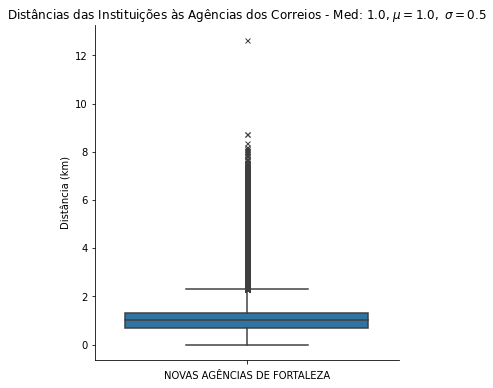

In [124]:
#Boxplot com os dados gerais
plt.figure(figsize =(10,6))
n_vetor = uniao_estabelecimentos['DIS.KM_NV']
sns.catplot(y= 'DIS.KM_NV', data = uniao_estabelecimentos, kind="box", margin_titles=True, flierprops={"marker": "x"})
plt.title(f"Distâncias das Instituições às Agências dos Correios - Med: {round(statistics.median(n_vetor), 1)}, " + fr'$\mu={round(statistics.mean(n_vetor),1)},\ \sigma={round(statistics.stdev(n_vetor),1)}$', loc="center", fontsize=12)
plt.xlabel("NOVAS AGÊNCIAS DE FORTALEZA")
plt.ylabel("Distância (km)")
plt.show()

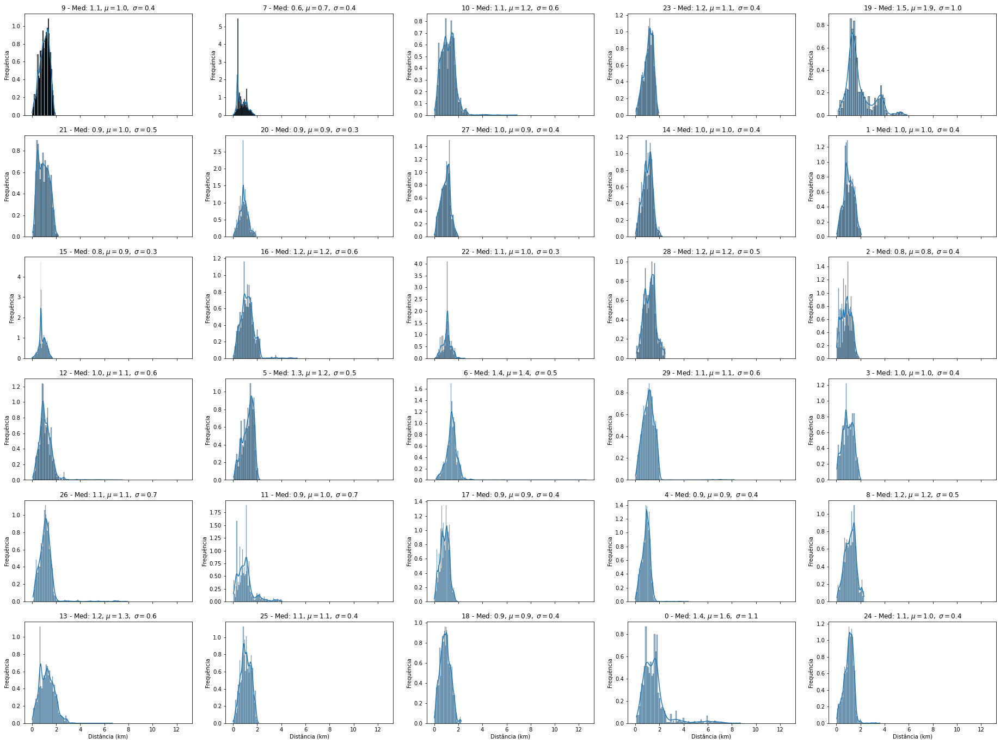

In [126]:
#Histograma e gráfico de densidade considerando a distribuição das instituições por cada agência dos Correios de Fortaleza
figure, axis = plt.subplots(6,5, figsize=(32,24), sharex=True ) # sharey=True, figsize=(20,8)

x = 0
y = 0

for i in novas_agencias:
    
    df_ag = uniao_estabelecimentos[uniao_estabelecimentos['POSIC_AGEN_SUG'] == i]
    vetor = df_ag['DIS.KM_NV']
    sns.histplot(data=df_ag, x="DIS.KM_NV", kde=True,stat="density", ax=axis[x][y])    
    axis[x, y].set_title(f"{i} - Med: {round(statistics.median(vetor), 1)}, " + fr'$\mu={round(statistics.mean(vetor),1)},\ \sigma={round(statistics.stdev(vetor),1)}$') 
    axis[x, y].set_ylabel('Frequência')
    axis[x, y].set_xlabel('Distância (km)')
    
    y += 1
    
    if y > 4:
        y -= 5
        x += 1
        
plt.show()

# Novos Mapas com *Scatterplot*

In [113]:
from matplotlib.colors import ListedColormap

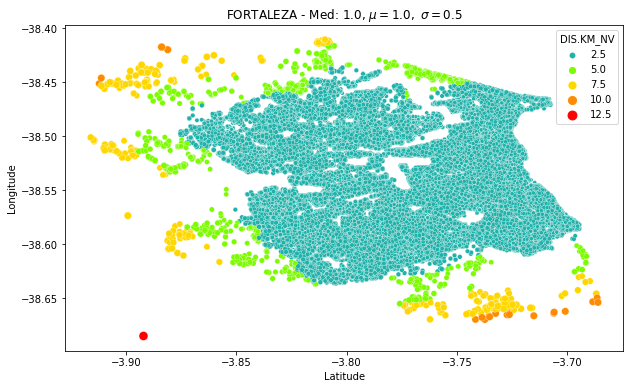

In [127]:
#Visão geral das distâncias em Fortaleza
plt.figure(figsize =(10,6))
n_vetor = uniao_estabelecimentos['DIS.KM_NV']
cmap = ListedColormap(["lightseagreen","lawngreen", "gold","darkorange", "red"])
sns.scatterplot(data=uniao_estabelecimentos, x="Latitude", y="Longitude", hue='DIS.KM_NV',  size='DIS.KM_NV', sizes=(10,80), palette= cmap)
plt.title(f"FORTALEZA - Med: {round(statistics.median(n_vetor), 1)}, " + fr'$\mu={round(statistics.mean(n_vetor),1)},\ \sigma={round(statistics.stdev(n_vetor),1)}$', loc="center", fontsize=12)
plt.xlabel("Latitude")
plt.ylabel("Longitude")
plt.show()

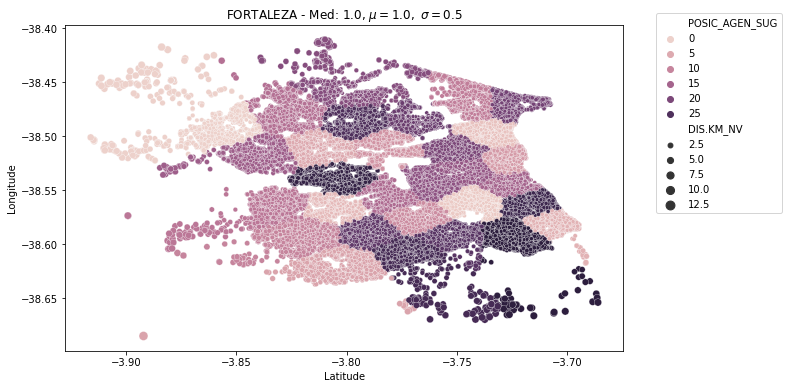

In [128]:
#Visão geral da distribuição de instituições por Agência de Correios Fortaleza
plt.figure(figsize =(10,6))
n_vetor = uniao_estabelecimentos['DIS.KM_NV']
g = sns.scatterplot(data=uniao_estabelecimentos, x="Latitude", y="Longitude", hue='POSIC_AGEN_SUG',  size='DIS.KM_NV', sizes=(10,80))
plt.title(f"FORTALEZA - Med: {round(statistics.median(n_vetor), 1)}, " + fr'$\mu={round(statistics.mean(n_vetor),1)},\ \sigma={round(statistics.stdev(n_vetor),1)}$', loc="center", fontsize=12)
plt.xlabel("Latitude")
plt.ylabel("Longitude")
sns.move_legend(g, "upper left", bbox_to_anchor=(1.05, 1.05))
plt.show()

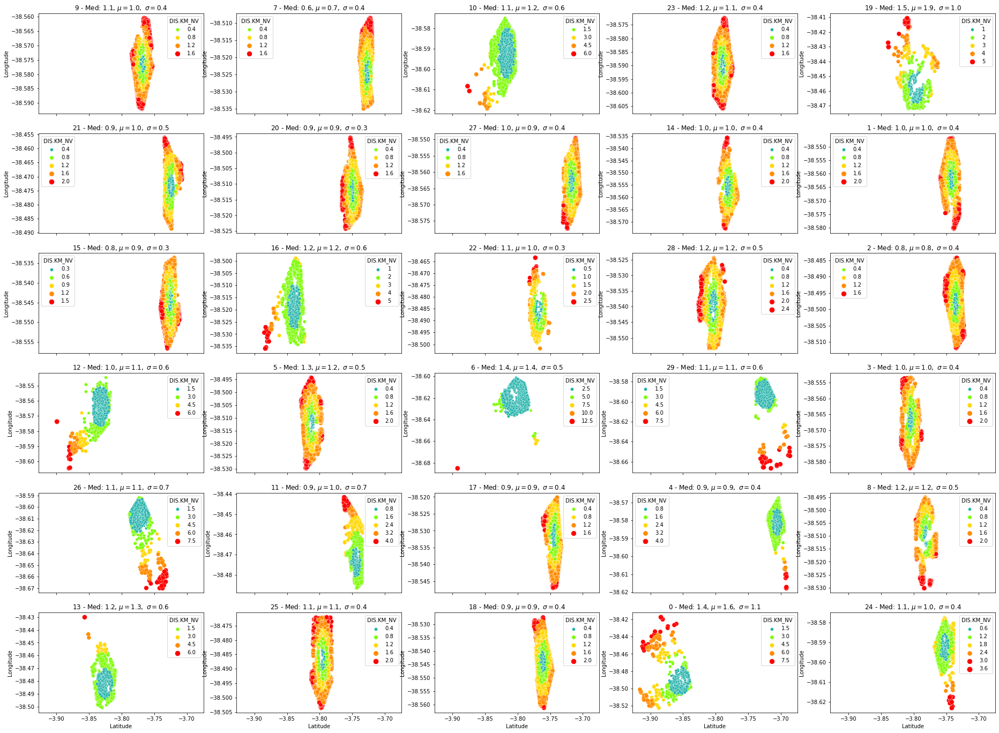

In [129]:
#Visão geral da distribuição de instituições por Cada Agência de Correios Fortaleza
figure, axis = plt.subplots(6,5, figsize=(32,24), sharex=True) # sharey=True, figsize=(20,8)

x = 0
y = 0

for i in novas_agencias:
    
    df_ag = uniao_estabelecimentos[uniao_estabelecimentos['POSIC_AGEN_SUG'] == i]#['DIS.KM_NV']
    vetor = df_ag['DIS.KM_NV']
    sns.scatterplot(data=df_ag, x="Latitude", y="Longitude", hue='DIS.KM_NV',  size='DIS.KM_NV', sizes=(10,80), ax=axis[x][y], palette= cmap)
    axis[x, y].set_title(f"{i} - Med: {round(statistics.median(vetor), 1)}, " + fr'$\mu={round(statistics.mean(vetor),1)},\ \sigma={round(statistics.stdev(vetor),1)}$')     
    axis[x, y].set_ylabel('Longitude')
    axis[x, y].set_xlabel('Latitude')    
    
    y += 1
    
    if y > 4:
        y -= 5
        x += 1
        
plt.show()

# Novos Mapas com *Folium*

In [130]:
import folium
from folium import plugins

In [146]:
coord_x = []

#definindo lista de coordenadas das instituições a serem anexadas ao mapa
for lat, lon in zip(uniao_estabelecimentos.Latitude.values, uniao_estabelecimentos.Longitude.values):
    coord_x.append([lat, lon])

#Definição da localização do mapa
mp_x = folium.Map(location=[-3.79615,-38.48303], zoom_start=11)

#anexando coordenadas das agências dos correios ao mapa
for j in agencias.index:    
    agen_selec = agencias['Agência'][j]
    agen_bairro = agencias['BAIRRO'][j]
    folium.Marker([agencias.LAT[j], agencias.LON[j]],
                popup=f'<i>{agen_selec}</i>',
                icon=folium.Icon(color="blue", prefix='fa', icon='map-marker'),
                tooltip = f'{agen_selec} - Bairro {agen_bairro}'
                ).add_to(mp_x)
    
for i in sorted(novas_agencias):    
    agen_selec = i
    folium.Marker([lats[i], lons[i]],
                popup=f'<i> Agência {i}</i>',
                icon=folium.Icon(color="green", prefix='fa', icon='map-marker'),
                tooltip = f'Agência {i}'
                ).add_to(mp_x)


#anexando lista de coordenadas das instituições a serem anexadas ao mapa como heatmap
mp_x.add_child(plugins.HeatMap(coord_x))

#mostrando o mapa
mp_x

In [147]:
#salvando novo mapa como html
mp_x.save(r'H:\OneDrive - Instituto Presbiteriano Mackenzie\02_PA\m2.html')